In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

sns.set(rc={'figure.figsize':(10,6.180)})
sns.set_style("whitegrid")

%matplotlib inline

plt.rcParams['figure.figsize'] = [16.18033, 10]    #golden ratio
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.dpi'] = 100

In [84]:
def my_reorder(a, first):
    # move first to the top. and keep the rest
    new_order = first.copy()
    for col in a:
        if col not in first:
            new_order.append(col)
    return new_order

def read_pdb(pre, name, run=30, rerun=2):
    all_data = []
    if run == -1:
        run_list = ["native"]
    else:
        run_list = list(range(run))
    for i in run_list:
        if rerun == -1:
            rerun_list = ["rerun"]
        else:
            rerun_list = list(range(rerun))
        for j in rerun_list:
            # pre = "/Users/weilu/Research/server/nov_2018/iterative_optimization_4/all_simulations/"
            location = pre + f"{name}/simulation/{i}/{j}/"
            try:
                wham = pd.read_csv(location+"wham.dat")
            except:
                print(f"PDB: {name}, Run: {i}, Rerun: {j} not exist")
                print(location+"wham.dat")
                continue
            wham.columns = wham.columns.str.strip()
            remove_columns = ['Tc', 'Energy']
            wham = wham.drop(remove_columns, axis=1)
            energy = pd.read_csv(location+"energy.dat")
            energy.columns = energy.columns.str.strip()
            remove_columns = ['Steps', 'Shake', 'Excluded', 'Helix', 'AMH-Go', 'Vec_FM', 'SSB']
            energy = energy.drop(remove_columns, axis=1)
            data = pd.concat([wham, energy], axis=1).assign(Repeat=i, Run=j)
            all_data.append(data)
    data = pd.concat(all_data).reset_index(drop=True)
    data = data.reindex(columns=my_reorder(data.columns, ["Steps", "Qw", "VTotal", "Run", "Repeat"]))
    print(name, len(data))
    return data

In [85]:
dataset = {"old":"1R69, 1UTG, 3ICB, 256BA, 4CPV, 1CCR, 2MHR, 1MBA, 2FHA".split(", "),
            "new":"1FC2C, 1ENH, 2GB1, 2CRO, 1CTF, 4ICB".split(", "),
            "test":["t089", "t120", "t251", "top7", "1ubq", "t0766", "t0778", "t0782", "t0792", "t0803", "t0815", "t0833", "t0842", "t0844"]}
dataset["combined"] = dataset["old"] + dataset["new"]

def get_complete_data(pre, folder_list, pdb_list, formatName=True, **kwargs):
    complete_all_data = []
    for folder in folder_list:
        # pre = "/Users/weilu/Research/server/april_2019/iterative_optimization_old_set/"
        pre_folder = f"{pre}{folder}/"
        all_data = []
        for p in pdb_list:
            if formatName:
                name = p.lower()[:4]
            else:
                name = p
            tmp = read_pdb(pre_folder, name, **kwargs)
            all_data.append(tmp.assign(Name=name))
        data = pd.concat(all_data)
        complete_all_data.append(data.assign(Folder=folder))
    data = pd.concat(complete_all_data)
    data = data.reindex(columns=my_reorder(data.columns, ["Name", "Folder"]))
    return data



In [86]:
pre = "/Users/weilu/Research/server/april_second_2019/test_set/"
# folder_list = ["multi_iter0", "original"]
folder_list = ["multi_iter0_with_minimization", "original_with_minimization"]
pdb_list = ['T0759-D1', 'T0953s2-D1', 'T0943-D1', 'T0773-D1', 'T0816-D1', 'T0854-D2', 'T0767-D1', 'T0853-D1', 'T0958-D1', 'T0834-D2', 'T0960-D3', 'T0862-D1', 'T0912-D3', 'T0898-D1', 'T0824-D1', 'T0782-D1', 'T0830-D2', 'T0761-D2', 'T0968s1-D1', 'T0870-D1', 'T0838-D1', 'T0803-D1']
data = get_complete_data(pre, folder_list, pdb_list, run=-1, rerun=-1, formatName=False)
data.Steps = data.Steps.astype(int)
native = data



T0759-D1 27
T0953s2-D1 27
T0943-D1 27
T0773-D1 27
T0816-D1 27
T0854-D2 27
T0767-D1 27
T0853-D1 27
T0958-D1 27
T0834-D2 27
T0960-D3 27
T0862-D1 27
T0912-D3 27
T0898-D1 27
T0824-D1 27
T0782-D1 27
T0830-D2 27
T0761-D2 27
T0968s1-D1 27
T0870-D1 27
T0838-D1 27
T0803-D1 27
T0759-D1 27
T0953s2-D1 27
T0943-D1 27
T0773-D1 27
T0816-D1 27
T0854-D2 27
T0767-D1 27
T0853-D1 27
T0958-D1 27
T0834-D2 27
T0960-D3 27
T0862-D1 27
T0912-D3 27
T0898-D1 27
T0824-D1 27
T0782-D1 27
T0830-D2 27
T0761-D2 27
T0968s1-D1 27
T0870-D1 27
T0838-D1 27
T0803-D1 27


In [89]:
native_energy = native.query("Steps == 0")

In [141]:
pre = "/Users/weilu/Research/server/april_second_2019/test_set/"
# folder_list = ["multi_iter0", "original"]
folder_list = ["multi_iter0_with_minimization", "original_with_minimization"]
pdb_list = ['T0759-D1', 'T0953s2-D1', 'T0943-D1', 'T0773-D1', 'T0816-D1', 'T0854-D2', 'T0767-D1', 'T0853-D1', 'T0958-D1', 'T0834-D2', 'T0960-D3', 'T0862-D1', 'T0912-D3', 'T0898-D1', 'T0824-D1', 'T0782-D1', 'T0830-D2', 'T0761-D2', 'T0968s1-D1', 'T0870-D1', 'T0838-D1', 'T0803-D1']
data = get_complete_data(pre, folder_list, pdb_list, run=10, rerun=-1, formatName=False)
data.Steps = data.Steps.astype(int)
subset_data = data.query("Steps % 80000 == 0")


T0759-D1 10020
T0953s2-D1 10020
T0943-D1 10020
T0773-D1 10020
T0816-D1 10020
T0854-D2 10020
T0767-D1 10020
T0853-D1 10020
T0958-D1 10020
T0834-D2 10020
T0960-D3 10020
T0862-D1 10020
T0912-D3 10020
T0898-D1 9888
T0824-D1 9765
T0782-D1 8885
T0830-D2 7739
T0761-D2 8281
T0968s1-D1 8142
T0870-D1 6737
T0838-D1 6532
T0803-D1 6236
T0759-D1 10020
T0953s2-D1 10020
T0943-D1 10020
T0773-D1 10020
T0816-D1 10020
T0854-D2 10020
T0767-D1 10020
T0853-D1 10020
T0958-D1 10020
T0834-D2 10020
T0960-D3 10020
T0862-D1 10020
T0912-D3 10020
T0898-D1 10020
T0824-D1 10020
T0782-D1 10020
T0830-D2 9776
T0761-D2 9511
T0968s1-D1 9962
T0870-D1 10020
T0838-D1 9880
T0803-D1 9681


In [142]:
data_today = pd.concat([data, native])

In [143]:
today = datetime.datetime.today().strftime('%m-%d')
print(today)
# data.reset_index(drop=True).to_csv(f"/Users/weilu/Research/data/optimization/energy_{today}.csv")
# a = pd.read_csv("/Users/weilu/Research/data/optimization/energy_03-31.csv", index_col=0)
# b = pd.read_csv("/Users/weilu/Research/data/optimization/energy_04-01.csv", index_col=0)
# data = pd.concat([a,b])
data.reset_index(drop=True).to_csv(f"/Users/weilu/Research/data/optimization/energy_{today}.csv")

04-21


In [156]:
prediction_energy = data.groupby(["Name", "Repeat", "Folder"]).tail(1).query("Steps > 4e6")

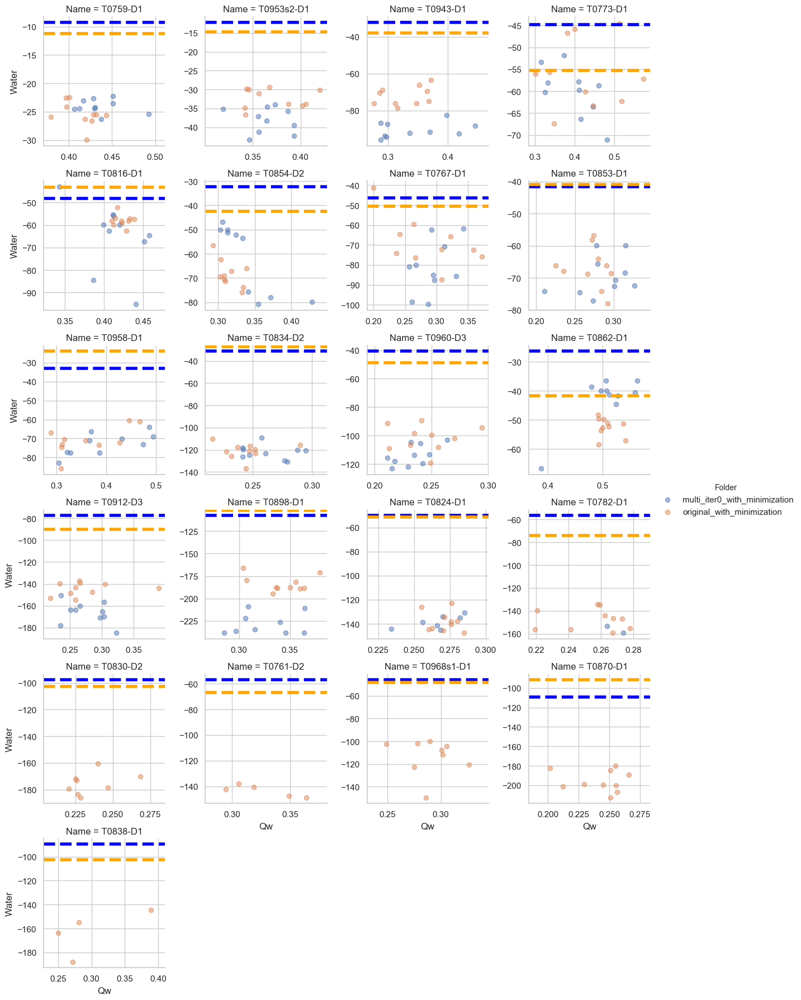

In [157]:
y_show = "Water"
g = sns.FacetGrid(prediction_energy, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", y_show, alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    # print(name)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

In [130]:
native_energy.query("Name == 'T0759-D1'")["VTotal"]

0   -269.640860
0   -302.509194
Name: VTotal, dtype: float64

In [129]:
native_energy.query("Name == 'T0759-D1'")["VTotal"].iloc[1]

-302.509193990993

In [135]:
native_energy.query("Name == 'T0773-D1'")

,Name,Folder,Steps,Qw,VTotal,Run,Repeat,Rg,Chain,Chi,Rama,DSSP,P_AP,Water,Burial,Frag_Mem,Membrane,Ebond,Epair
0,T0773-D1,multi_iter0_with_minimization,0,0.962184,-816.800587,rerun,native,10.281000,5.54499,2.321355,-273.582624,-34.583105,-20.634047,-44.846211,-40.147558,-410.873387,0,0.766555,0.352036
0,T0773-D1,original_with_minimization,0,0.952982,-848.641638,rerun,native,10.292924,4.79076,2.247894,-274.704599,-34.891223,-19.586545,-55.332057,-60.135171,-411.030696,0,0.843432,0.382778


In [126]:
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    print(name)
    energy = native_energy.query(f"Name == '{name}'")["VTotal"].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")["VTotal"].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

T0953s2-D1
T0943-D1
T0773-D1
T0816-D1
T0854-D2
T0767-D1
T0853-D1
T0958-D1
T0834-D2
T0960-D3
T0862-D1
T0912-D3
T0898-D1
T0824-D1
T0782-D1
T0830-D2
T0761-D2
T0968s1-D1
T0870-D1
T0838-D1
T0803-D1


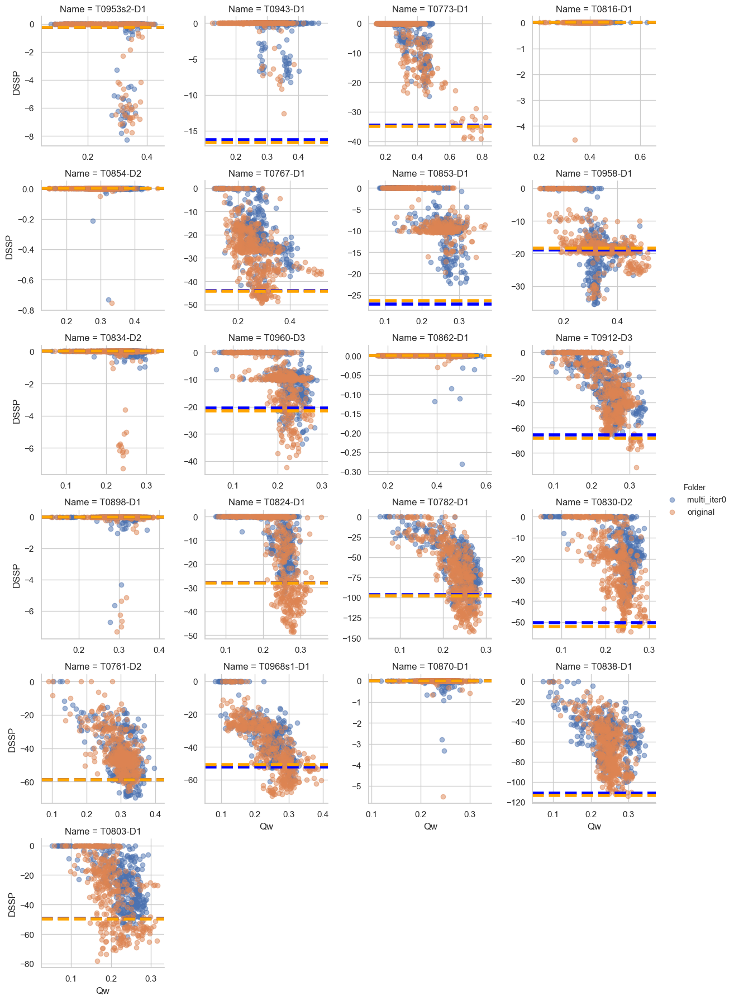

In [140]:
y_show = "DSSP"
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", y_show, alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    # print(name)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

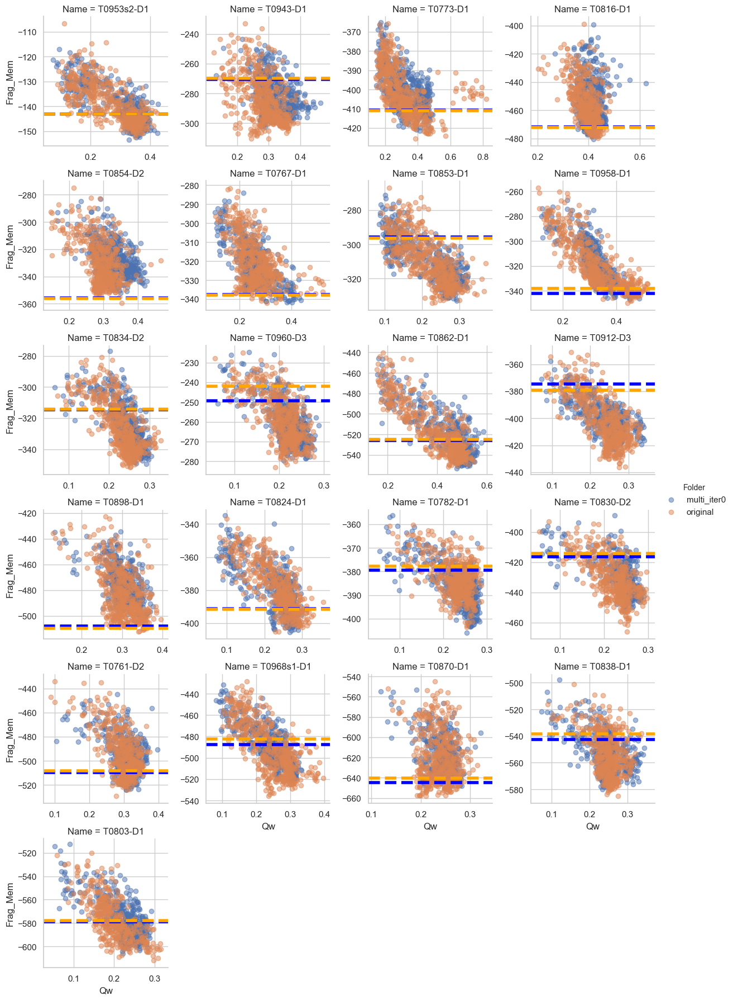

In [139]:
y_show = "Frag_Mem"
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", y_show, alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    # print(name)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

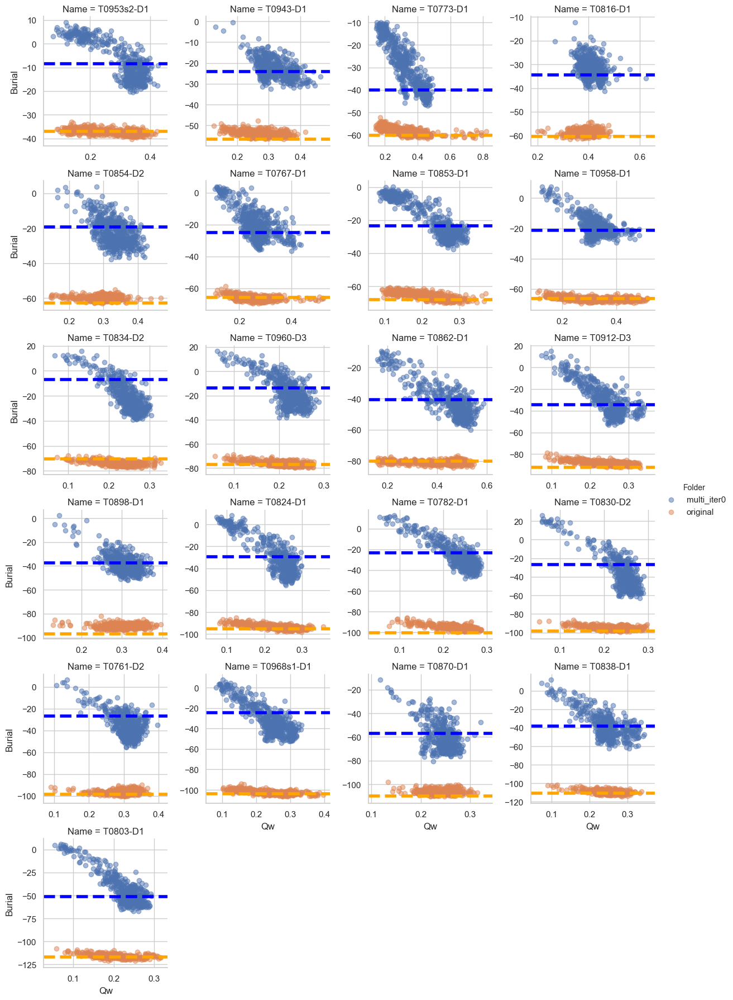

In [137]:
y_show = "Burial"
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", y_show, alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    # print(name)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

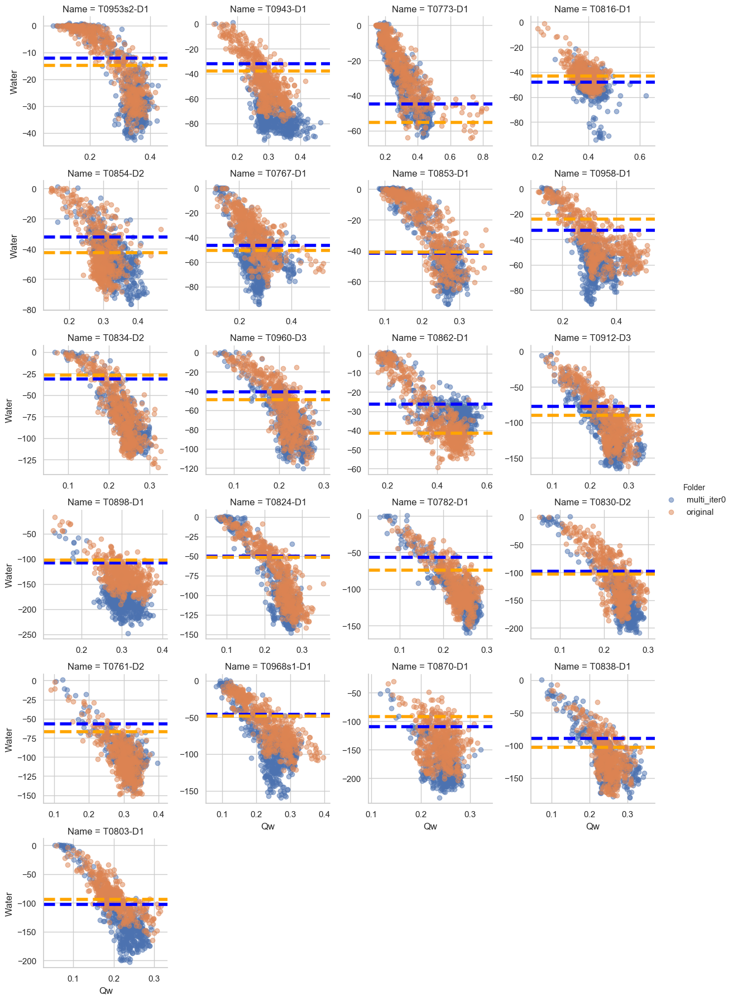

In [136]:
y_show = "Water"
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", y_show, alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    # print(name)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")[y_show].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

T0953s2-D1
T0943-D1
T0773-D1
T0816-D1
T0854-D2
T0767-D1
T0853-D1
T0958-D1
T0834-D2
T0960-D3
T0862-D1
T0912-D3
T0898-D1
T0824-D1
T0782-D1
T0830-D2
T0761-D2
T0968s1-D1
T0870-D1
T0838-D1
T0803-D1


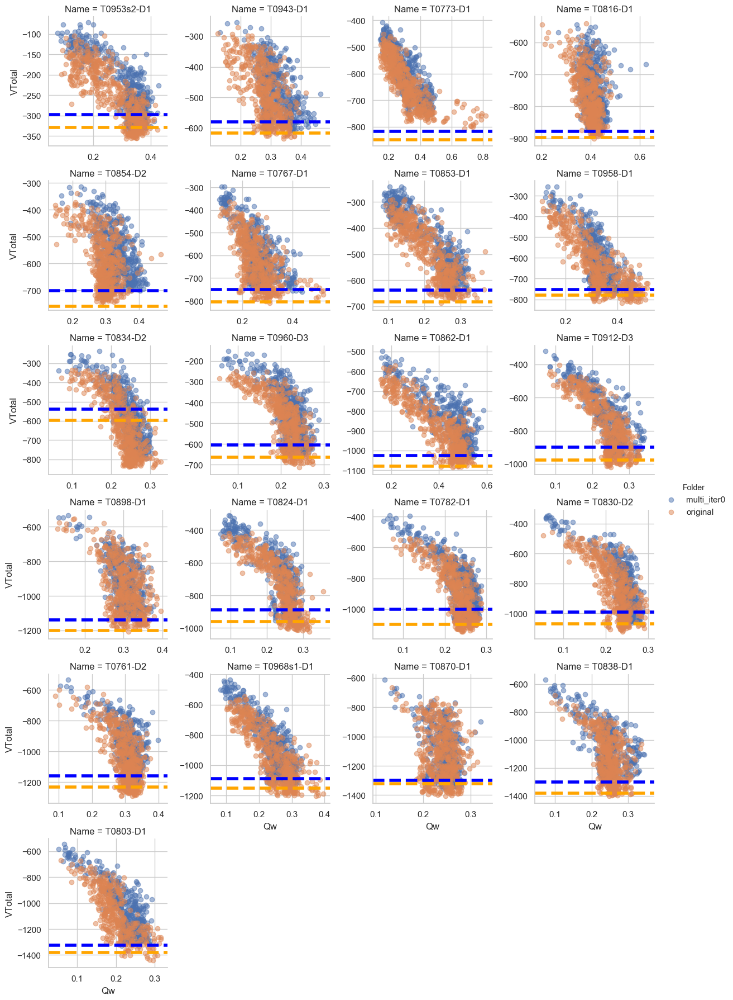

In [131]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", "VTotal", alpha=0.5).add_legend())
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="blue", linewidth=4)
# energy = native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")["VTotal"][0]
# g.axes[0].axhline(energy, ls="--", color="orange", linewidth=4)
for ax in g.axes:
    name= ax.title.get_text().split(" ")[-1]
    print(name)
    energy = native_energy.query(f"Name == '{name}'")["VTotal"].iloc[0]
    ax.axhline(energy, ls="--", color="blue", linewidth=4)
    energy = native_energy.query(f"Name == '{name}'")["VTotal"].iloc[1]
    ax.axhline(energy, ls="--", color="orange", linewidth=4)

In [ ]:
g.axes[0].axhline(native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"], ls="--")

In [103]:
vtotal = native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"][0]

In [102]:
vtotal[0]

-269.64085959520503

In [98]:
native_energy.query("Name == 'T0759-D1' and Folder == 'multi_iter0_with_minimization'")["VTotal"]

0   -269.64086
Name: VTotal, dtype: float64

In [97]:
native_energy.query("Name == 'T0759-D1' and Folder == 'original_with_minimization'")

,Name,Folder,Steps,Qw,VTotal,Run,Repeat,Rg,Chain,Chi,Rama,DSSP,P_AP,Water,Burial,Frag_Mem,Membrane,Ebond,Epair
0,T0759-D1,original_with_minimization,0,0.944458,-302.509194,rerun,native,8.987343,2.19446,0.828416,-125.067232,0.0,-1.30635,-11.179329,-30.917603,-137.061555,0,0.565642,0.212432


In [91]:
native_energy.shape

(44, 19)

In [83]:
native_energy

[]

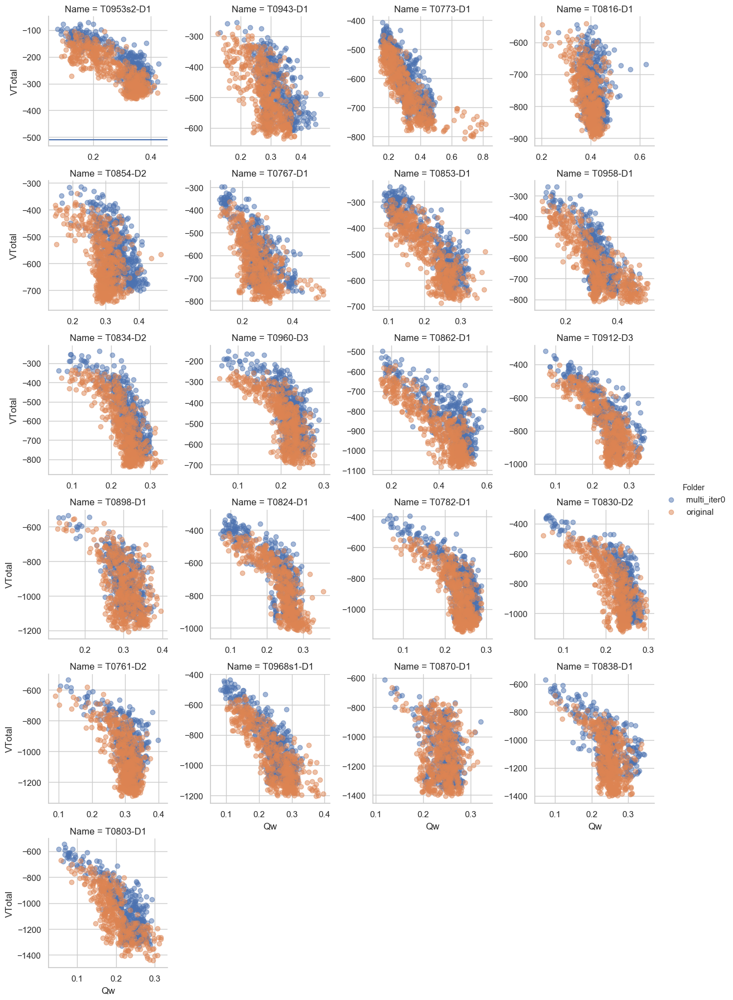

In [82]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", "VTotal", alpha=0.5).add_legend())
g.axes[0].axhline(-510)

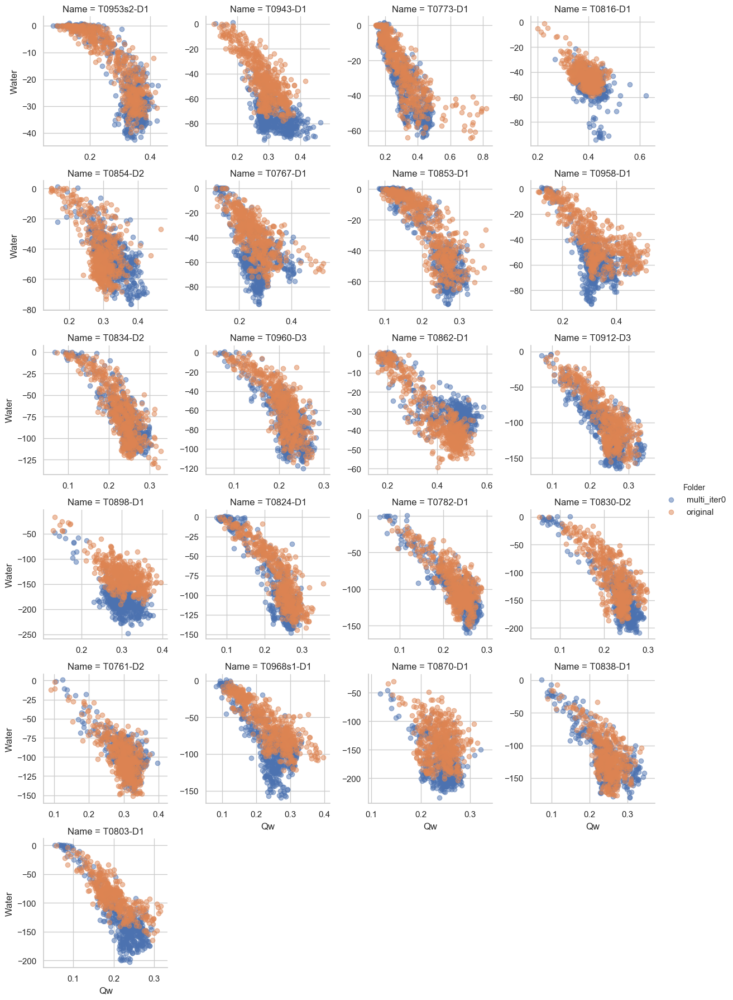

In [71]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", "Water", alpha=0.5).add_legend())

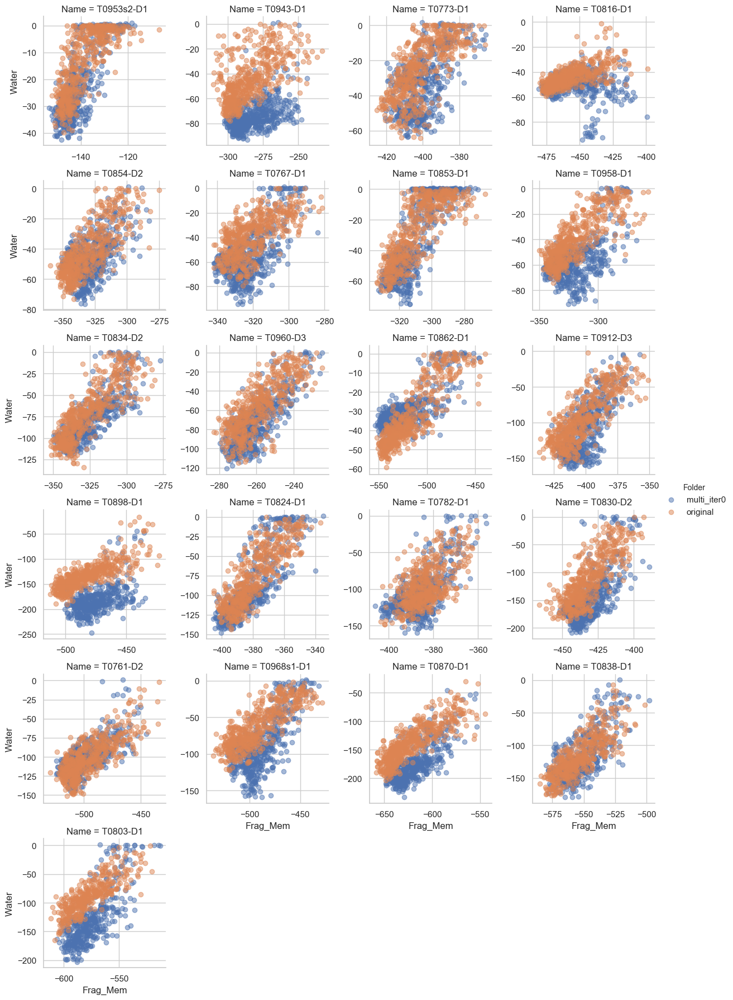

In [72]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Frag_Mem", "Water", alpha=0.5).add_legend())

In [6]:
pre = "/Users/weilu/Research/server/april_2019/iterative_optimization_combined_train_set_with_frag/"
folder_list = ["multi_iter0"]
pdb_list = dataset["combined"]
data = get_complete_data(pre, folder_list, pdb_list, run=30, rerun=1)
data.Steps = data.Steps.astype(int)
subset_data = data.query("Steps % 80000 == 0")
today = datetime.datetime.today().strftime('%m-%d')
print(today)
# data.reset_index(drop=True).to_csv(f"/Users/weilu/Research/data/optimization/energy_{today}.csv")
# a = pd.read_csv("/Users/weilu/Research/data/optimization/energy_03-31.csv", index_col=0)
# b = pd.read_csv("/Users/weilu/Research/data/optimization/energy_04-01.csv", index_col=0)
# data = pd.concat([a,b])
data.reset_index(drop=True).to_csv(f"/Users/weilu/Research/data/optimization/energy_{today}.csv")

1r69 30000
1utg 30000
3icb 30000
256b 30000
4cpv 30000
1ccr 30000
2mhr 30000
1mba 19305
2fha 16112
1fc2 60000
1enh 60000
2gb1 60000
2cro 60000
1ctf 60000
4icb 60000


TypeError: unsupported operand type(s) for %: 'object' and '<class 'int'>'

In [19]:
a = data["Steps"].unique()

In [39]:
from Bio.PDB.PDBParser import PDBParser
pdbFileLocation = '/Users/weilu/Research/database/chosen/T0869-D1.pdb'
structure = PDBParser().get_structure("a", pdbFileLocation)
len(list(structure.get_residues()))

In [47]:
data = pd.read_csv("/Users/weilu/Research/server/april_second_2019/test_set/seq_info.dat", names=["i", "protein", "length"], sep=" ")




In [56]:
d = data.sort_values("length").reset_index(drop=True).reset_index().drop("i", axis=1)

In [57]:
d.to_csv("/Users/weilu/Research/server/april_second_2019/test_set/seq_info.csv")

In [60]:
d = pd.read_csv("/Users/weilu/Research/server/april_second_2019/test_set/seq_info.csv", index_col=0)
d.query("length < 150 and index % 2 == 0")

,index,protein,length
0,0,T0759-D1,34
2,2,T0953s2-D1,44
4,4,T0943-D1,62
6,6,T0773-D1,67
8,8,T0816-D1,68
10,10,T0854-D2,70
12,12,T0767-D1,76
14,14,T0853-D1,76
16,16,T0958-D1,77
18,18,T0834-D2,86


In [64]:
d.query("length < 150 and index % 2 == 0")["protein"].tolist()

['T0759-D1',
 'T0953s2-D1',
 'T0943-D1',
 'T0773-D1',
 'T0816-D1',
 'T0854-D2',
 'T0767-D1',
 'T0853-D1',
 'T0958-D1',
 'T0834-D2',
 'T0960-D3',
 'T0862-D1',
 'T0912-D3',
 'T0898-D1',
 'T0824-D1',
 'T0782-D1',
 'T0830-D2',
 'T0761-D2',
 'T0968s1-D1',
 'T0870-D1',
 'T0838-D1',
 'T0803-D1']

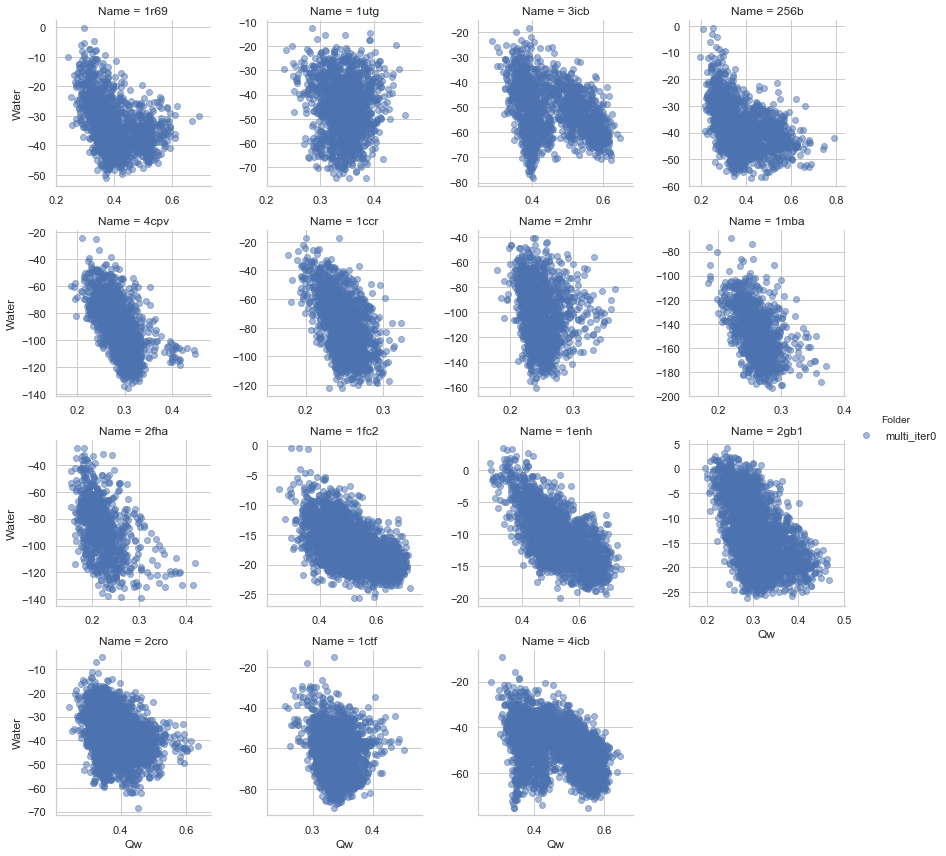

In [34]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Qw", "Water", alpha=0.5).add_legend())

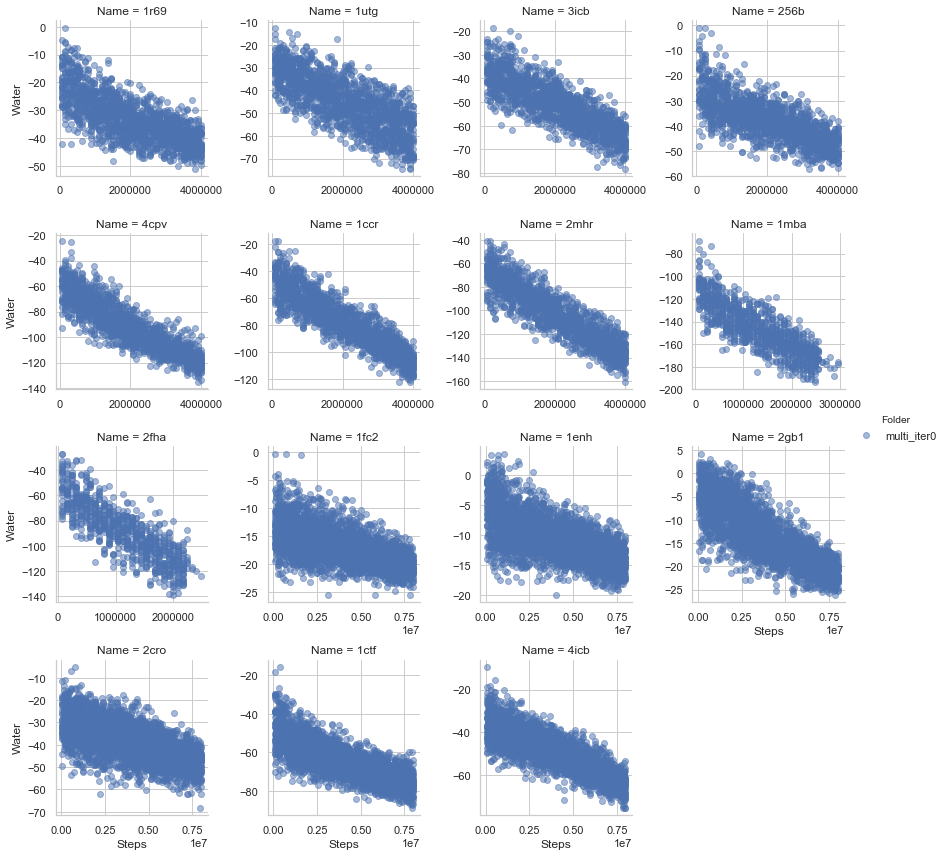

In [33]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Steps", "Water", alpha=0.5).add_legend())

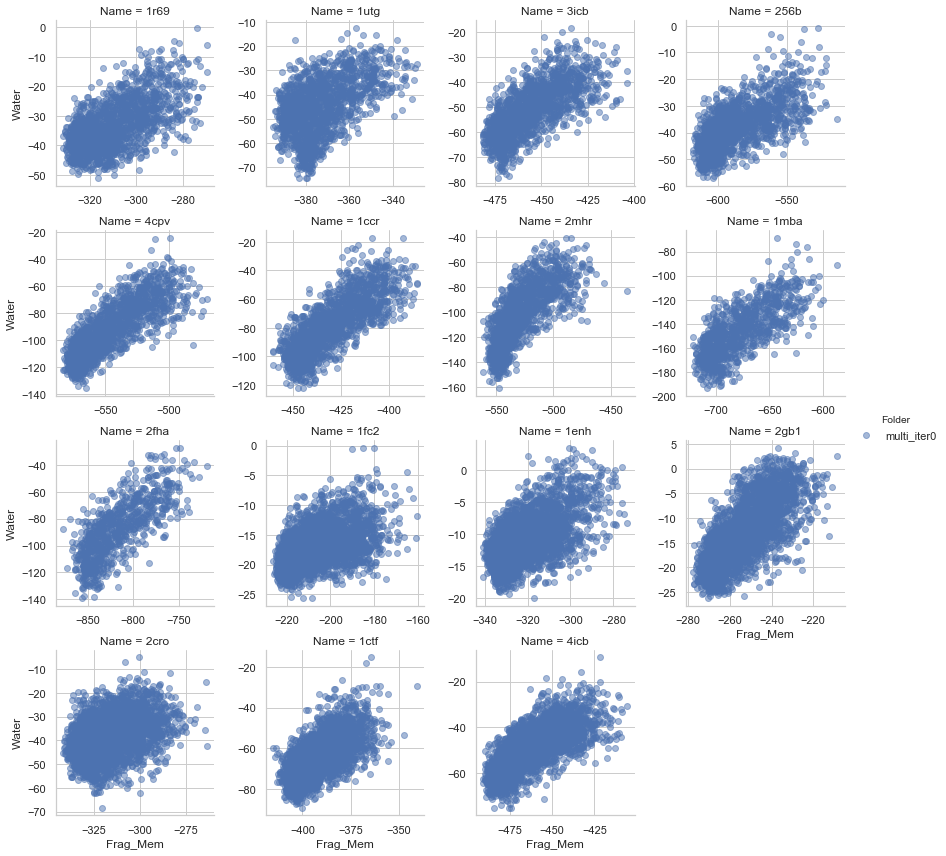

In [32]:
g = sns.FacetGrid(subset_data, col="Name",col_wrap=4,  hue="Folder", sharey=False, sharex=False)
g = (g.map(plt.scatter, "Frag_Mem", "Water", alpha=0.5).add_legend())